In [1]:
## some useful packages
from matplotlib.pyplot import subplots, cm 
import sklearn.model_selection as skm
from ISLP import load_data , confusion_table
import numpy as np
from sklearn.svm import SVC
from ISLP.svm import plot as plot_svm
from sklearn.metrics import RocCurveDisplay
import matplotlib.pyplot as plt

# Q5

In [2]:
Auto = load_data('Auto')
Auto

,mpg,cylinders,displacement,horsepower,weight,acceleration,year,origin,name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino
...,...,...,...,...,...,...,...,...,...
387,27.0,4,140.0,86,2790,15.6,82,1,ford mustang gl
388,44.0,4,97.0,52,2130,24.6,82,2,vw pickup
389,32.0,4,135.0,84,2295,11.6,82,1,dodge rampage
390,28.0,4,120.0,79,2625,18.6,82,1,ford ranger


## (a)

In [3]:
## Create a binary variable
mpg = Auto['mpg']
mpg_med = mpg.median()
bi_mpg = [1 if i > mpg_med else 0 for i in mpg]

In [4]:
## Select columns randomly
columns = ['cylinders', 'displacement', 'horsepower', 'weight', 'acceleration', 'year', 'origin']
y = np.array(bi_mpg)

i_values = np.random.choice(7, 2, replace=False)
j_values = np.random.choice(7, 2, replace=False)

/var/folders/nl/dgt8hdmn7_v0m0qwx5kv3sx40000gn/T/ipykernel_17997/2201480917.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = subplots(figsize=(8,8))


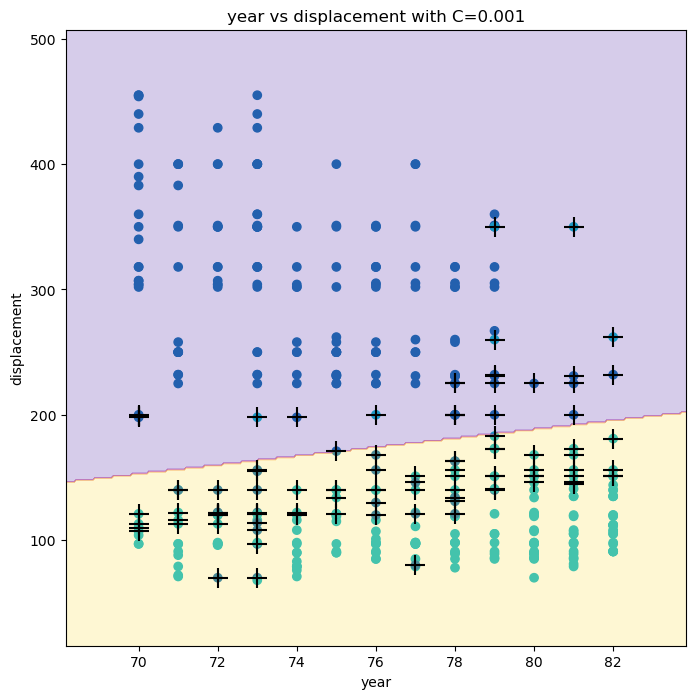

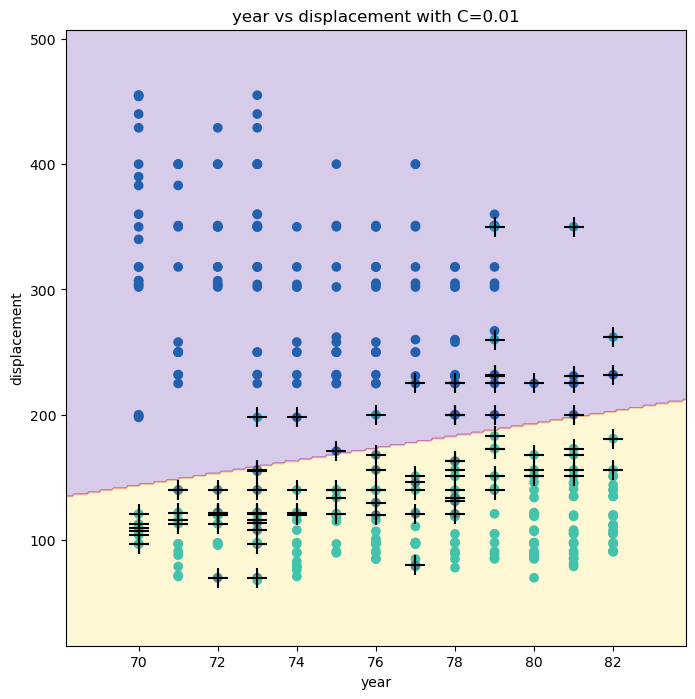

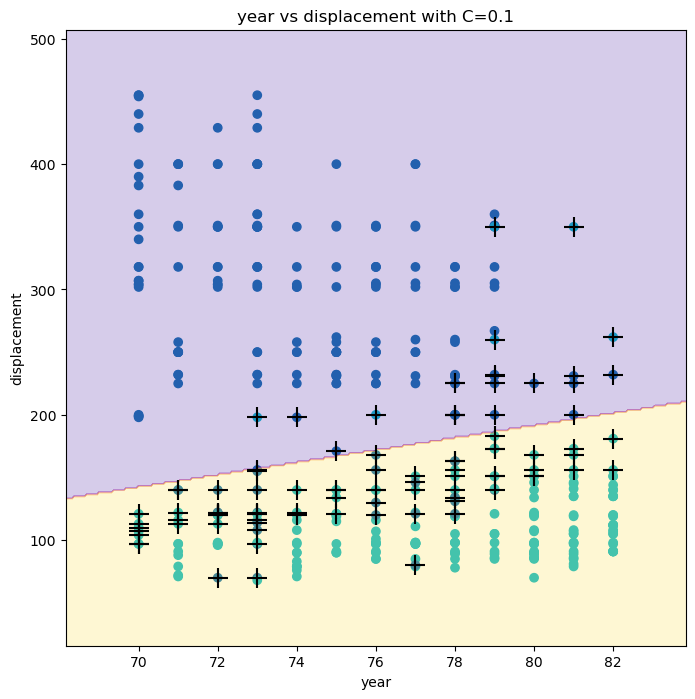

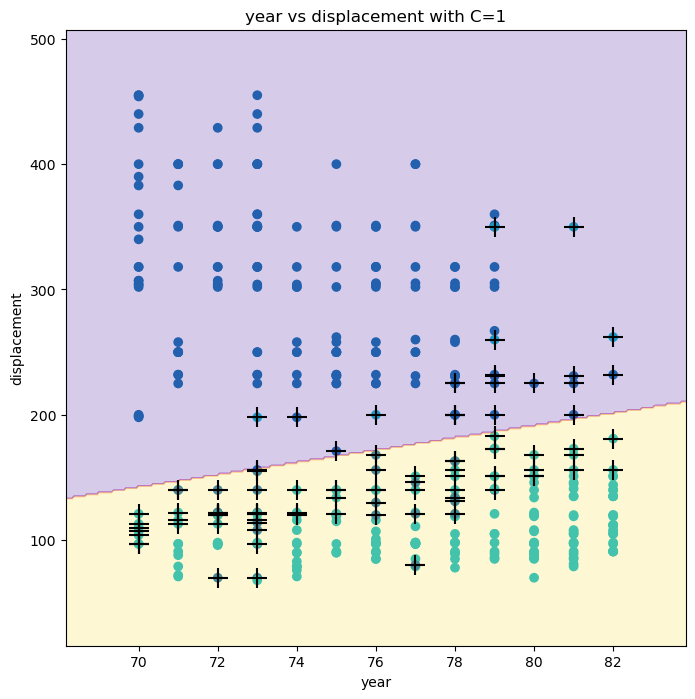

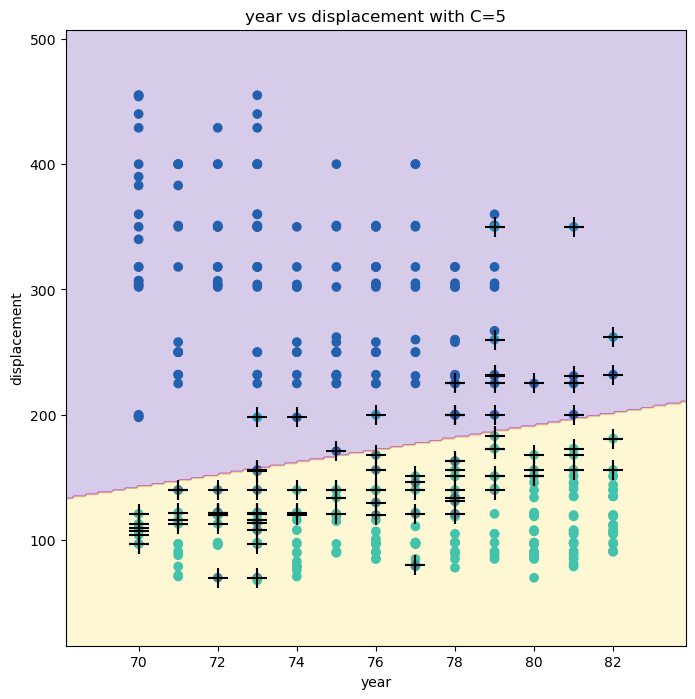

...

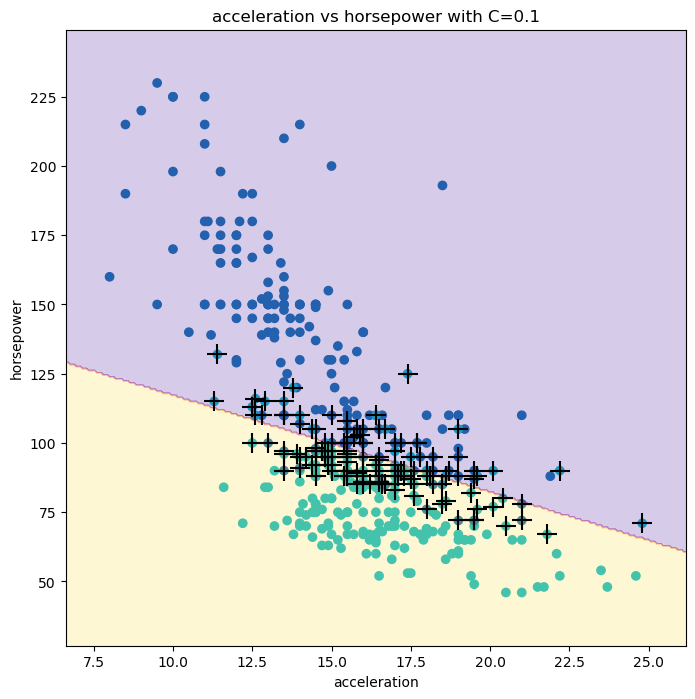

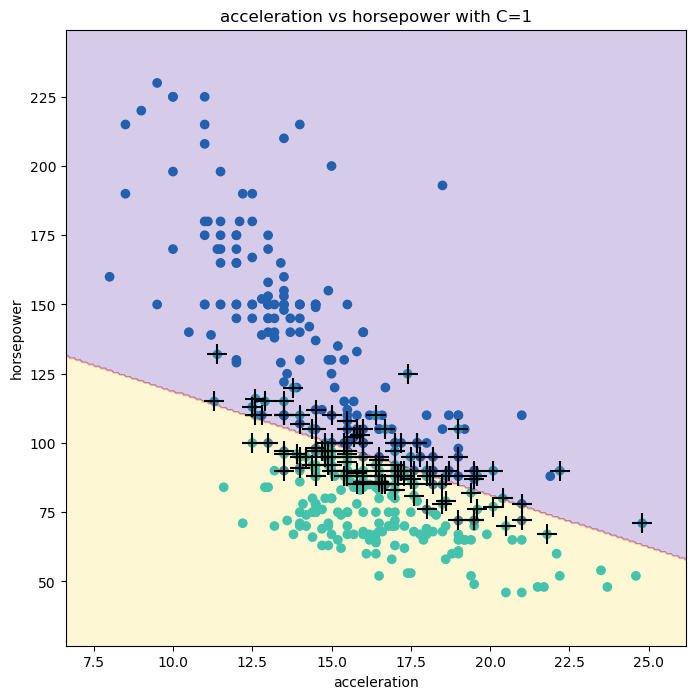

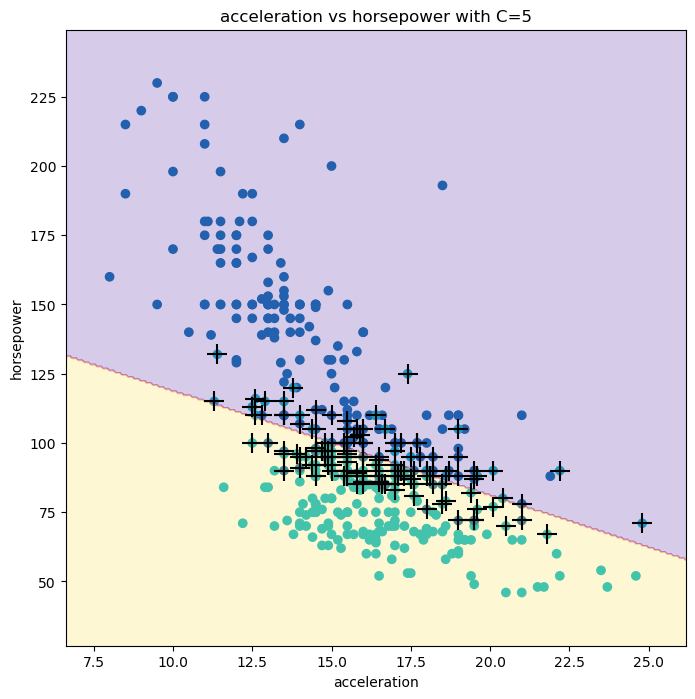

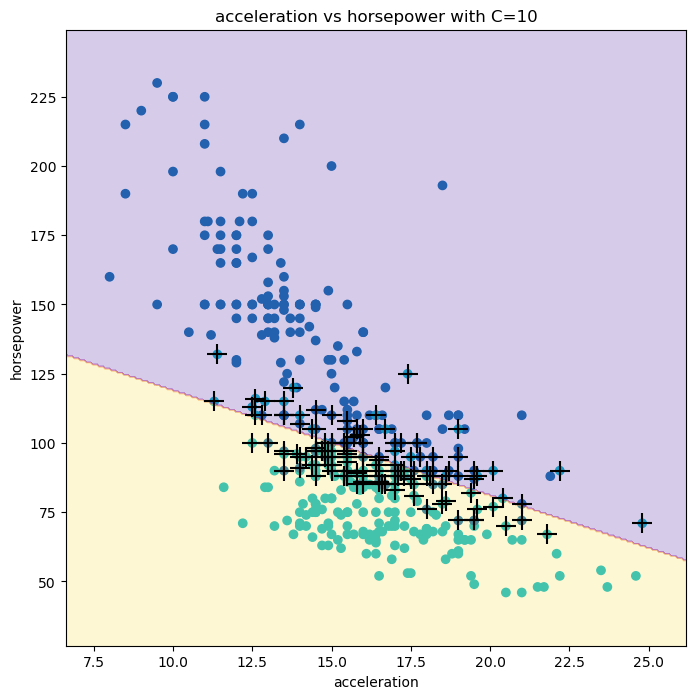

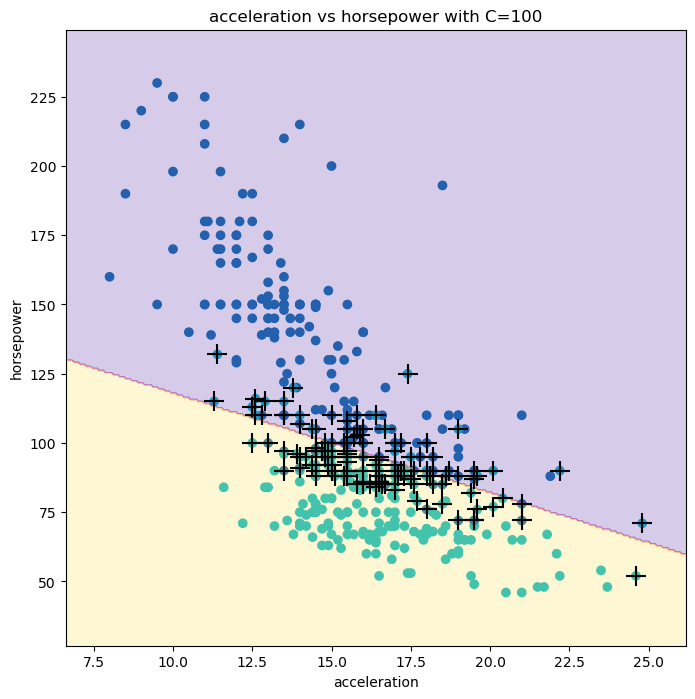

In [5]:
## Fit a support vector classifier with various C values
C_values = [0.001,0.01,0.1,1,5,10,100]

for i in i_values:
    for j in j_values:
        X = np.array(Auto[[columns[i], columns[j]]])
        for c in C_values:
            svm_linear = SVC(C=c, kernel='linear')
            svm_linear.fit(X, y)
            fig, ax = subplots(figsize=(8,8)) 
            plt.xlabel(f'{columns[i]}')
            plt.ylabel(f'{columns[j]}')
            plt.title(f'{columns[i]} vs {columns[j]} with C={c}')
            plot_svm(X, y, svm_linear , ax=ax)

In [6]:
## cv errors with various of C

kfold = skm.KFold(5, random_state=0, shuffle=True) 
grid = skm.GridSearchCV(svm_linear, \
                        {'C':[0.001,0.01,0.1,1,5,10,100]}, \
                            refit=True, cv=kfold, scoring='accuracy')
grid.fit(X, y) 
grid.cv_results_[('mean_test_score')]

array([0.83661149, 0.85699448, 0.84427134, 0.84170724, 0.84427134,
       0.84427134, 0.84423888])

I choose some columns randomly. There are many different results according to selected predictors. Also there are many cv errors from a lot of C.

## (b)

In [7]:
## Various C and gamma

C_values = [0.1,1,10,100,1000]
gamma_values = [0.5,1,2,3,4]

/var/folders/nl/dgt8hdmn7_v0m0qwx5kv3sx40000gn/T/ipykernel_17997/2712177635.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = subplots(figsize=(8,8))


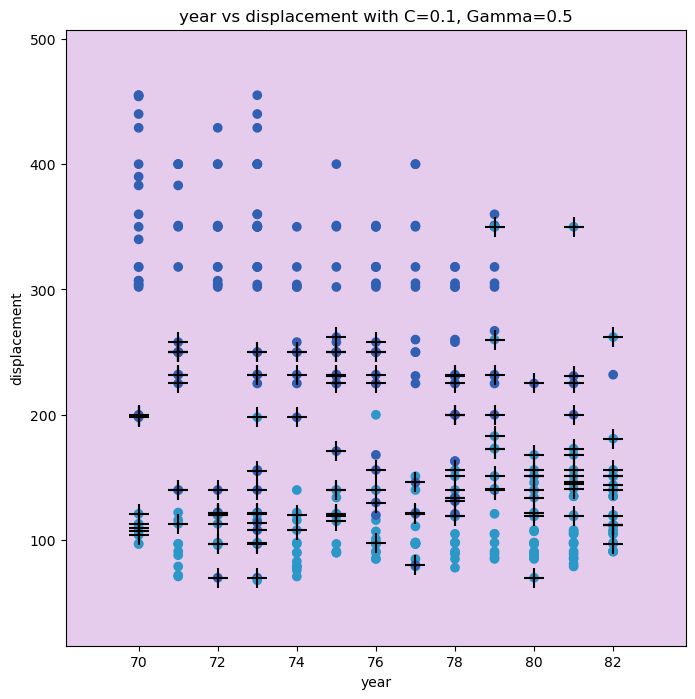

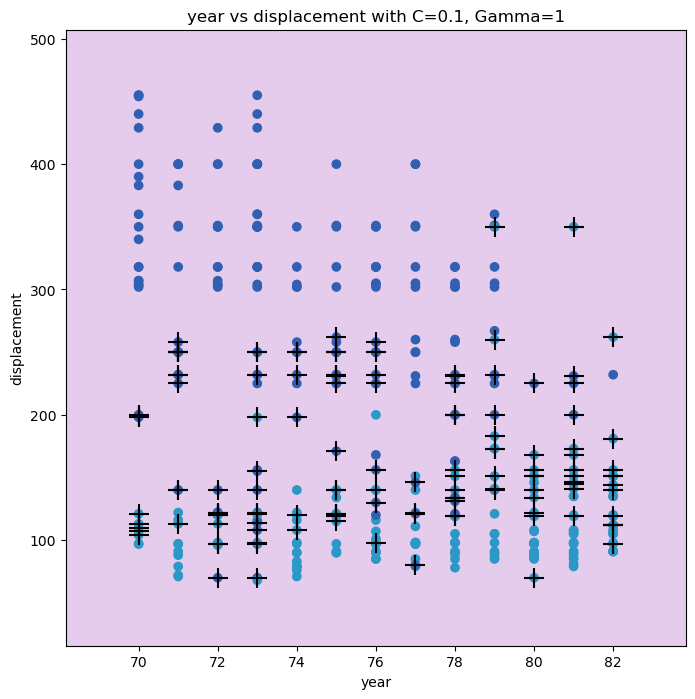

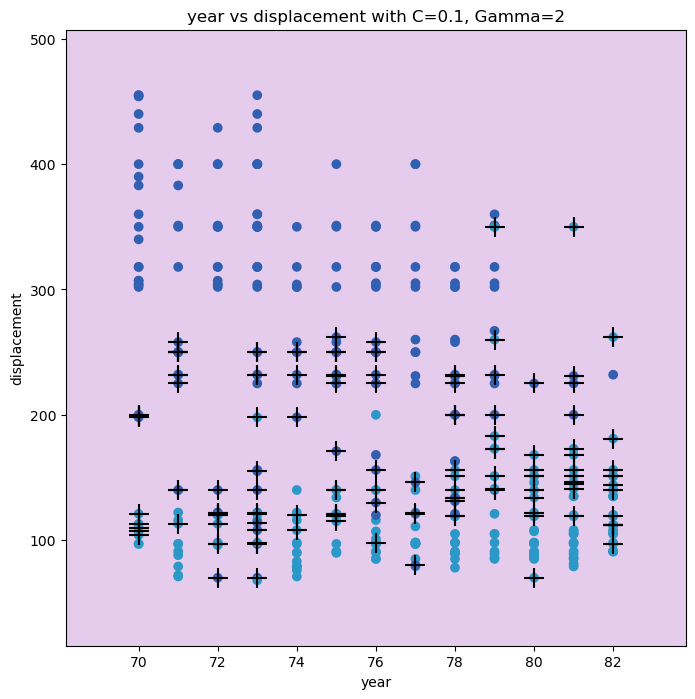

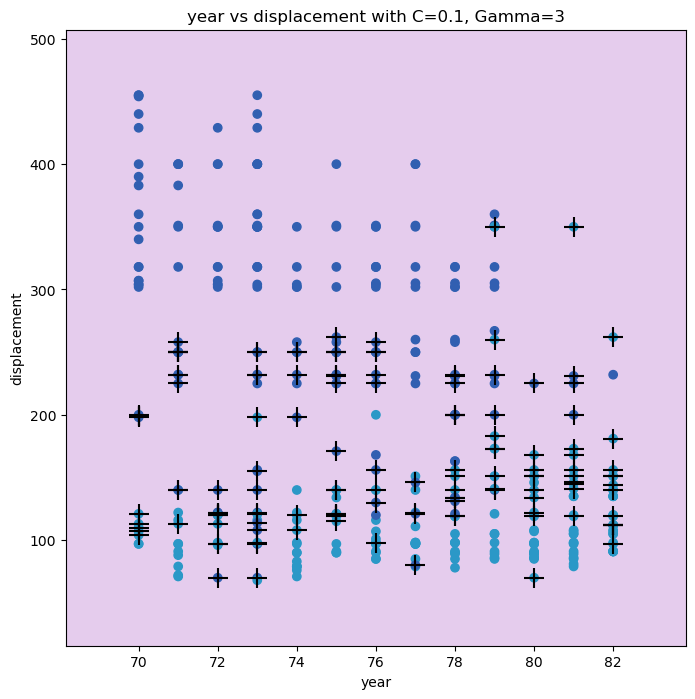

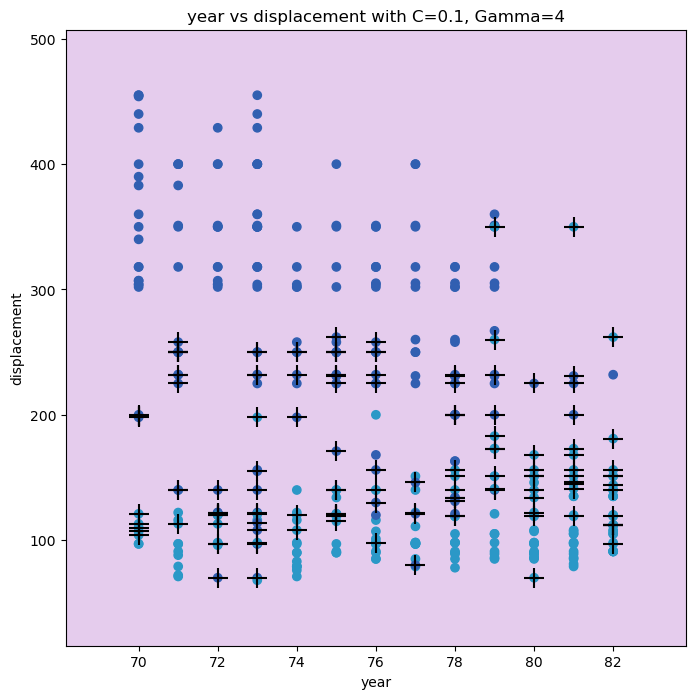

...

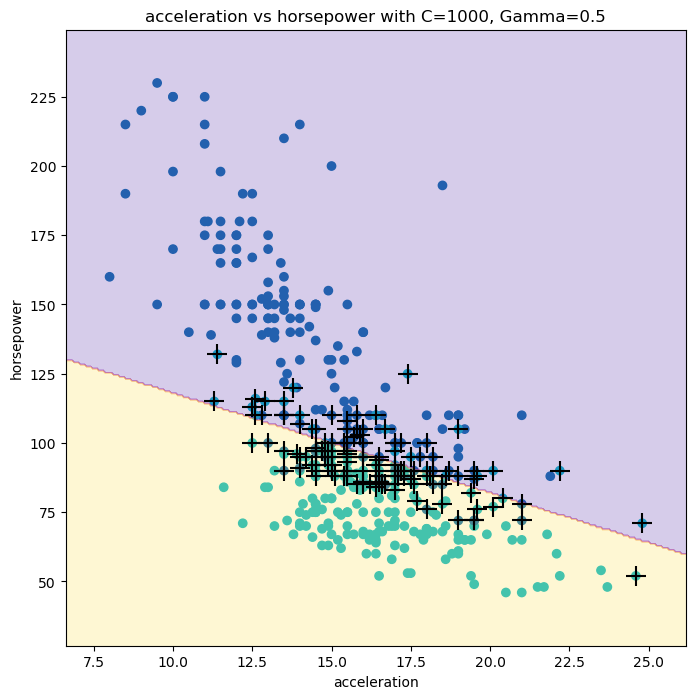

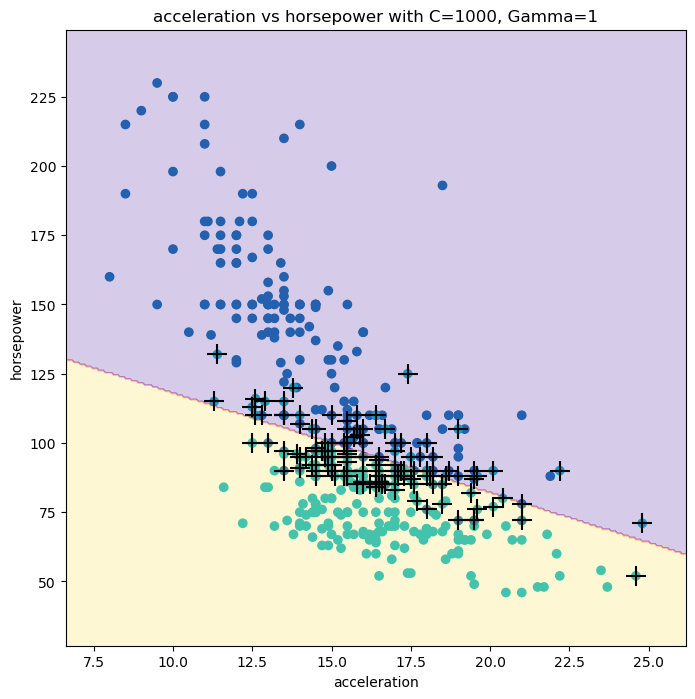

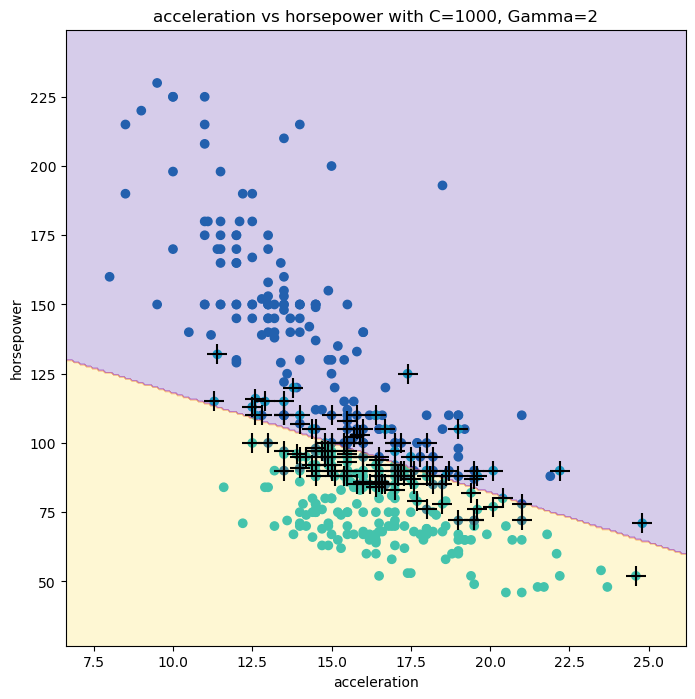

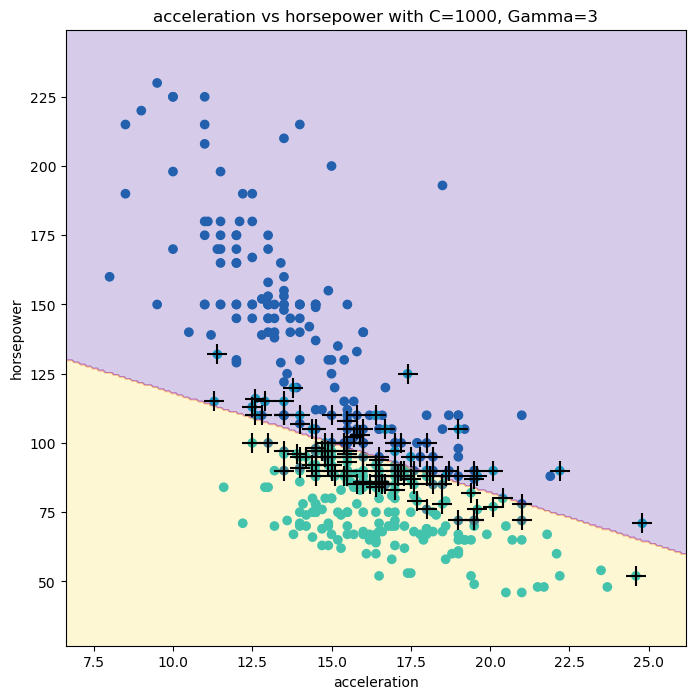

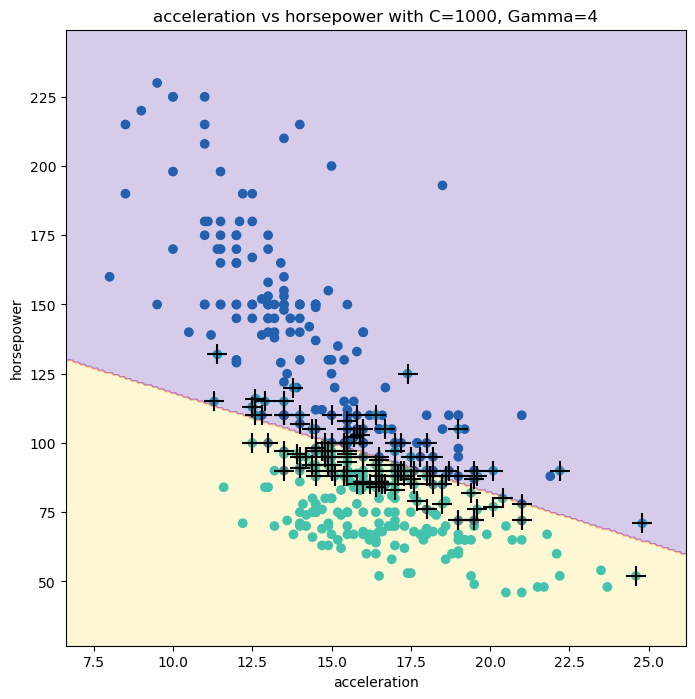

In [8]:
## Fit a SVM with radial basis kernel with various of C and Gamma

for i in i_values:
    for j in j_values:
        X = np.array(Auto[[columns[i], columns[j]]])
        for c in C_values:
            for gamma in gamma_values:
                svm_rbf = SVC(kernel="rbf", gamma=gamma, C=c)
                svm_rbf.fit(X, y)
                fig, ax = subplots(figsize=(8,8))
                plt.xlabel(f'{columns[i]}')
                plt.ylabel(f'{columns[j]}')
                plt.title(f'{columns[i]} vs {columns[j]} with C={c}, Gamma={gamma}')                
                plot_svm(X, y, svm_linear , ax=ax)

In [9]:
## cv errors with various of C and Gamma
kfold = skm.KFold(5, random_state=0, \
                  shuffle=True) 
grid = skm.GridSearchCV(svm_rbf, \
{'C':[0.1,1,10,100,1000], 'gamma':[0.5,1,2,3,4]}, \
refit=True, cv=kfold, scoring='accuracy')
grid.fit(X, y) 
grid.cv_results_[('mean_test_score')]

array([0.51285297, 0.43872119, 0.43106134, 0.43106134, 0.43106134,
       0.81882506, 0.7909445 , 0.72960078, 0.67857838, 0.65306719,
       0.82658228, 0.77309315, 0.73476144, 0.68117494, 0.66072704,
       0.80360273, 0.76546576, 0.73216488, 0.6965271 , 0.66585524,
       0.79857189, 0.77555988, 0.75001623, 0.6965271 , 0.66585524])

I choose some columns randomly. There are many different results according to selected predictors. Also there are many cv errors from a lot of C and gamma.

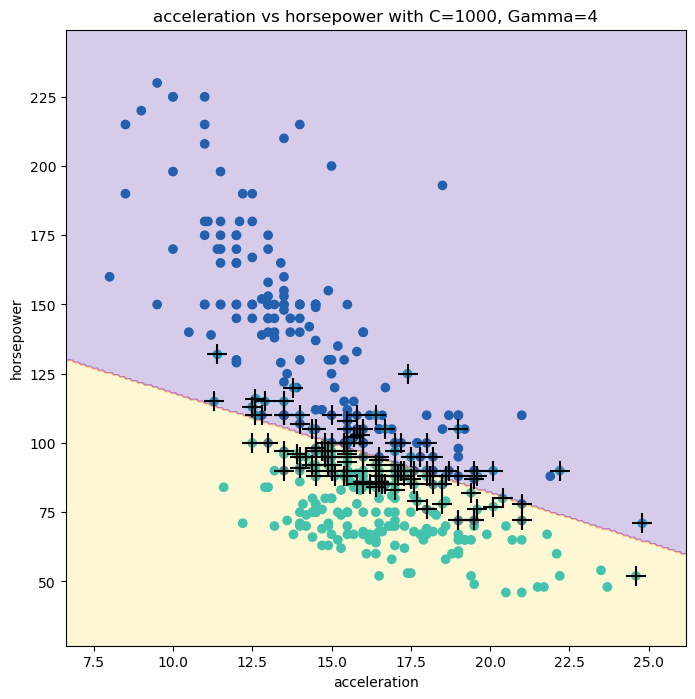

In [10]:
## Fit a SVM with polynomial basis kernel with c=1, gamma=1

X = np.array(Auto[[columns[i], columns[j]]])
svm_rbf = SVC(kernel="poly", gamma=1, C=1)
svm_rbf.fit(X, y)
fig, ax = subplots(figsize=(8,8)) 
plt.xlabel(f'{columns[i]}')
plt.ylabel(f'{columns[j]}')
plt.title(f'{columns[i]} vs {columns[j]} with C={c}, Gamma={gamma}')  
plot_svm(X, y, svm_linear , ax=ax)

In [11]:
## cv errors with C = 1 and Gamma = 1

kfold = skm.KFold(5, random_state=0, \
                  shuffle=True) 
grid = skm.GridSearchCV(svm_rbf, \
{'C':[1], 'gamma':[1]}, \
refit=True, cv=kfold, scoring='accuracy')
grid.fit(X, y) 
grid.cv_results_[('mean_test_score')]

array([0.82375852])

In [11]:
## Fit a SVM with polynomial basis kernel with various of C and Gamma
## Caution: long executing time

for i in i_values:
    for j in j_values:
        X = np.array(Auto[[columns[i], columns[j]]])
        for c in C_values:
            for gamma in gamma_values:
                svm_rbf = SVC(kernel="poly", gamma=gamma, C=c)
                svm_rbf.fit(X, y)
                # print("hello")
                fig, ax = subplots(figsize=(8,8)) 
                plt.xlabel(f'{columns[i]}')
                plt.ylabel(f'{columns[j]}')
                plt.title(f'{columns[i]} vs {columns[j]} with C={c}, Gamma={gamma}')  
                plot_svm(X, y, svm_linear , ax=ax)

hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello


/var/folders/nl/dgt8hdmn7_v0m0qwx5kv3sx40000gn/T/ipykernel_16479/1791842342.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = subplots(figsize=(8,8))


hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello
hello


In [13]:
## cv errors with various of C and Gamma
## Caution: long executing time

kfold = skm.KFold(5, random_state=0, \
                  shuffle=True) 
grid = skm.GridSearchCV(svm_rbf, \
{'C':[0.1,1,10,100,1000], 'gamma':[0.5,1,2,3,4]}, \
refit=True, cv=kfold, scoring='accuracy')
grid.fit(X, y) 
grid.cv_results_[('mean_test_score')]

I choose some columns randomly. There are many different results according to selected predictors. Also there are many cv errors from a lot of C and gamma. Especially, SVM with polynomial basis kernel consumes a lot of time, thus I fit and plot only C=1, gamma=1 case.

# Q6

In [31]:
from lifelines import (KaplanMeierFitter, \
CoxPHFitter)
from lifelines.statistics import \
(logrank_test , multivariate_logrank_test)
from ISLP.survival import sim_time
import pandas as pd
from ISLP.models import ModelSpec as MS

## (a)

In [32]:
BrainCancer = load_data('BrainCancer')

In [33]:
BrainCancer.loc[62, 'ki'] = 40
BrainCancer

,sex,diagnosis,loc,ki,gtv,stereo,status,time
0,Female,Meningioma,Infratentorial,90,6.11,SRS,0,57.64
1,Male,HG glioma,Supratentorial,90,19.35,SRT,1,8.98
2,Female,Meningioma,Infratentorial,70,7.95,SRS,0,26.46
3,Female,LG glioma,Supratentorial,80,7.61,SRT,1,47.80
4,Male,HG glioma,Supratentorial,90,5.06,SRT,1,6.30
...,...,...,...,...,...,...,...,...
83,Male,HG glioma,Supratentorial,80,0.16,SRT,1,20.69
84,Male,HG glioma,Supratentorial,80,19.81,SRT,1,6.39
85,Male,Meningioma,Supratentorial,90,2.50,SRT,0,32.82
86,Male,Meningioma,Supratentorial,90,2.02,SRS,0,42.07


<Axes: xlabel='timeline'>

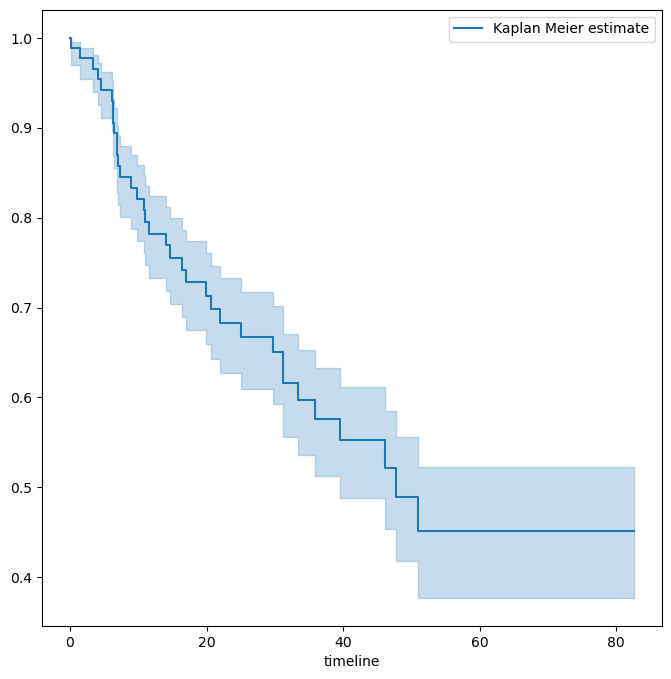

In [34]:
## Plot the Kaplan-Meier survival curve

fig, ax = subplots(figsize=(8,8))
km = KaplanMeierFitter(alpha=0.32)
km_brain = km.fit(BrainCancer['time'], BrainCancer['status']) 
km_brain.plot(label='Kaplan Meier estimate', ax=ax)

In [35]:
## Standard error of the Kaplan-Meier survival curve

confidence_interval = km_brain.confidence_interval_
standard_error = (confidence_interval.iloc[:, 1] - confidence_interval.iloc[:, 0]) / (2 * 1.96)
standard_error

0.00     0.000000
0.07     0.006685
1.18     0.006685
1.41     0.008741
1.54     0.008741
           ...   
65.02    0.037133
67.38    0.037133
73.74    0.037133
78.75    0.037133
82.56    0.037133
Length: 87, dtype: float64

## (b)

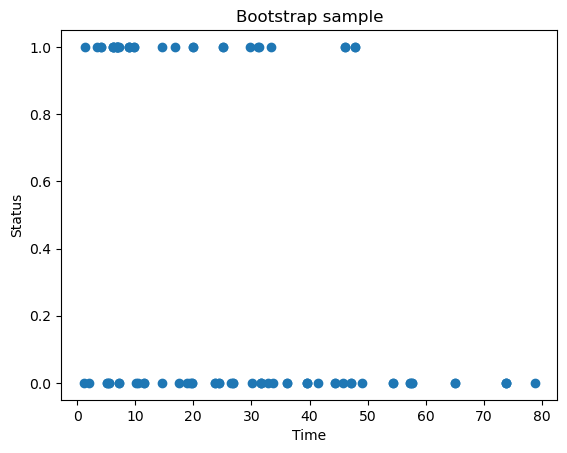

In [39]:
y_delta = BrainCancer[['time', 'status']]

## draw a bootstrap sample
tem = y_delta.sample(88, replace=True)
plt.scatter(tem['time'], tem['status'])
plt.title('Bootstrap sample')
plt.xlabel('Time')
plt.ylabel('Status')
plt.show()

<Axes: xlabel='timeline'>

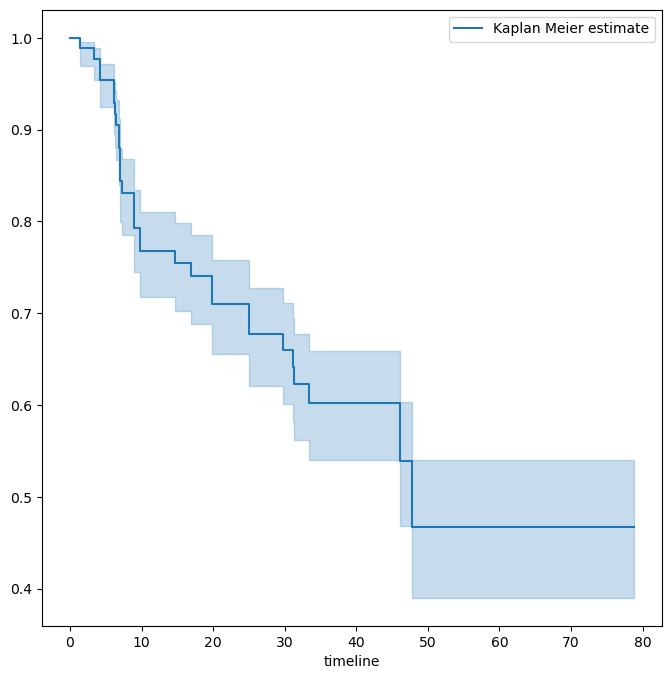

In [40]:
## Compute the resulting Kaplan-Meier survival curve

fig, ax = subplots(figsize=(8,8))
km = KaplanMeierFitter(alpha=0.32)
km_brain = km.fit(tem['time'], tem['status']) 
km_brain.plot(label='Kaplan Meier estimate', ax=ax)

In [41]:
## Repeat 200 times
sample = []

for _ in range(200):
    tem_boot = y_delta.sample(88, replace=True)
    sample.append(tem_boot)


In [42]:
km = KaplanMeierFitter(alpha=0.32)
km_brain_boot = km.fit(tem['time'], tem['status']) 
confidence_interval = km_brain_boot.confidence_interval_
standard_error = (confidence_interval.iloc[:, 1] - confidence_interval.iloc[:, 0]) / (2 * 1.96)
standard_error

0.00     0.000000
1.18     0.000000
1.41     0.006761
2.03     0.006761
3.38     0.008840
4.16     0.011901
5.15     0.011901
5.51     0.011901
6.10     0.014460
6.23     0.015536
6.39     0.016513
6.82     0.018234
6.92     0.019710
7.05     0.020374
7.18     0.020374
7.25     0.021040
8.98     0.022788
9.77     0.023775
10.10    0.023775
10.49    0.023775
11.48    0.023775
11.51    0.023775
14.56    0.023775
14.62    0.024340
16.92    0.024865
17.57    0.024865
18.95    0.024865
19.41    0.024865
19.74    0.024865
19.90    0.026093
23.67    0.026093
24.39    0.026093
25.02    0.027422
26.46    0.027422
26.85    0.027422
29.70    0.028141
30.16    0.028141
31.15    0.028841
31.25    0.029463
31.67    0.029463
32.82    0.029463
33.41    0.030289
33.67    0.030289
36.10    0.030289
39.54    0.030289
41.44    0.030289
44.39    0.030289
45.74    0.030289
46.16    0.034521
47.11    0.034521
47.80    0.038224
49.05    0.038224
54.43    0.038224
57.25    0.038224
57.64    0.038224
65.02    0

The pattern is similar, but it increases over time.

## (c)

In [84]:
coxph = CoxPHFitter 
cleaned = BrainCancer.dropna()
all_MS = MS(cleaned.columns, intercept=False)
all_df = all_MS.fit_transform(cleaned) 
fit_all = coxph().fit(all_df, 'time', 'status') 
fit_all.summary[['coef', 'se(coef)', 'p']]

,coef,se(coef),p
covariate,,,
sex[Male],0.183748,0.360358,0.610119
diagnosis[LG glioma],-1.239530,0.579555,0.032455
diagnosis[Meningioma],-2.154566,0.450524,0.000002
diagnosis[Other],-1.268870,0.617672,0.039949
loc[Supratentorial],0.441195,0.703669,0.530665
ki,-0.054955,0.018314,0.002693
gtv,0.034293,0.022333,0.124661
stereo[SRT],0.177778,0.601578,0.767597


From p-value of diagnosis[Meningioma], it is the most significant predictors among the others.

## (d)

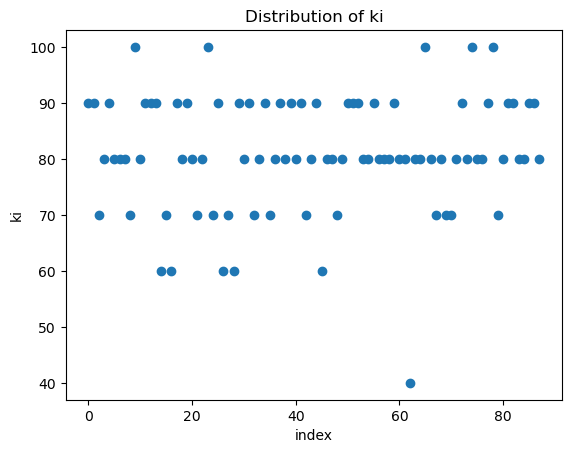

In [124]:
num = [i for i in range(88)]
plt.scatter(num, BrainCancer['ki'])
plt.xlabel('index')
plt.ylabel('ki')
plt.title('Distribution of ki')
plt.show()

In [157]:
## Change the value which ki == 40 to ki = 60
BrainCancer.loc[62, 'ki'] = 60

In [161]:
levels = BrainCancer['ki'].unique()
def representative(series):
    if hasattr(series.dtype, 'categories'): 
        return pd.Series.mode(series)
    else:
        return series.mean()
modal_data = cleaned.apply(representative, axis=0)

In [163]:
modal_df = pd.DataFrame([modal_data.iloc[0] for _ in range(len(levels))])
modal_df['ki'] = levels
modal_df

,sex,diagnosis,loc,ki,gtv,stereo,status,time
0,Female,Meningioma,Supratentorial,90,8.687011,SRT,0.402299,27.188621
0,Female,Meningioma,Supratentorial,70,8.687011,SRT,0.402299,27.188621
0,Female,Meningioma,Supratentorial,80,8.687011,SRT,0.402299,27.188621
0,Female,Meningioma,Supratentorial,100,8.687011,SRT,0.402299,27.188621
0,Female,Meningioma,Supratentorial,60,8.687011,SRT,0.402299,27.188621


In [164]:
modal_X = all_MS.transform(modal_df) 
modal_X.index = levels
modal_X

,sex[Male],diagnosis[LG glioma],diagnosis[Meningioma],diagnosis[Other],loc[Supratentorial],ki,gtv,stereo[SRT],status,time
90,0.0,0.0,1.0,0.0,1.0,90,8.687011,1.0,0.402299,27.188621
70,0.0,0.0,1.0,0.0,1.0,70,8.687011,1.0,0.402299,27.188621
80,0.0,0.0,1.0,0.0,1.0,80,8.687011,1.0,0.402299,27.188621
100,0.0,0.0,1.0,0.0,1.0,100,8.687011,1.0,0.402299,27.188621
60,0.0,0.0,1.0,0.0,1.0,60,8.687011,1.0,0.402299,27.188621


In [165]:
predicted_survival = fit_all.predict_survival_function(modal_X)
predicted_survival

,90,70,80,100,60
0.07,0.998753,0.996261,0.997840,0.999280,0.993532
1.18,0.998753,0.996261,0.997840,0.999280,0.993532
1.41,0.997374,0.992140,0.995455,0.998484,0.986421
1.54,0.997374,0.992140,0.995455,0.998484,0.986421
2.03,0.997374,0.992140,0.995455,0.998484,0.986421
...,...,...,...,...,...
65.02,0.797428,0.506907,0.675589,0.877517,0.308173
67.38,0.797428,0.506907,0.675589,0.877517,0.308173
73.74,0.797428,0.506907,0.675589,0.877517,0.308173
78.75,0.797428,0.506907,0.675589,0.877517,0.308173


<Axes: >

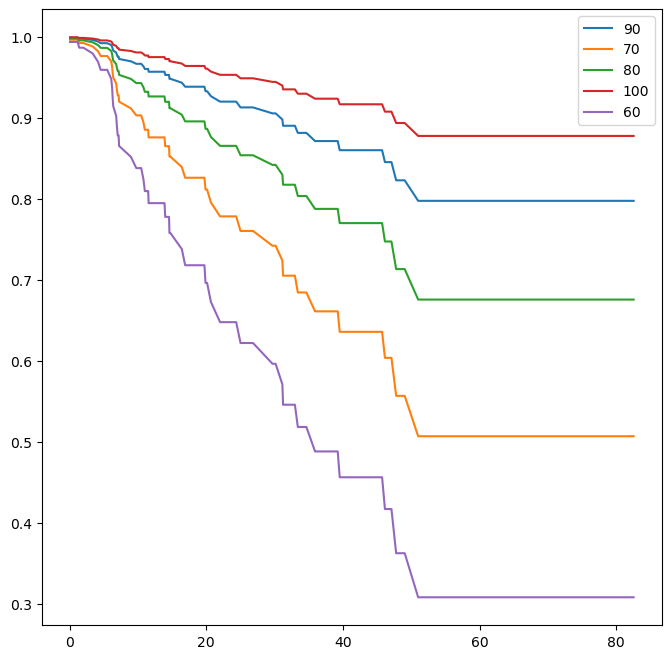

In [166]:
## Plot the Kaplan-Meier survival curve with different ki

fig, ax = subplots(figsize=(8, 8))
predicted_survival.plot(ax=ax)